<a href="https://colab.research.google.com/github/MathewsJosh/Topicos-Computacao-Cientifica-II/blob/main/Aula_11_CalibracaoCamera.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Calibração de Câmera

Neste tutorial, veremos como realizar calibração de câmera utilizando o OpenCV.

## 1 - Detecção dos pontos

O primeiro passo é realizar a detecção dos pontos nas imagens e estabelecer as correspondências com os pontos em coordenadas do padrão. As imagens podem ser lidas diretamente através de arquivos de imagens ou extraídas de vídeo. Nesse tutorial utilizaremos imagens de exemplo do próprio OpenCV, disponíveis no [link](https://github.com/opencv/opencv/tree/4.x/samples/data). Consideraremos um conjunto de 42 pontos extraídos do padrão xadrez. Como não temos as medidas exatas, trataremos com a distância de 1 unidade.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


4.1.2


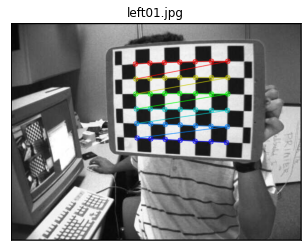

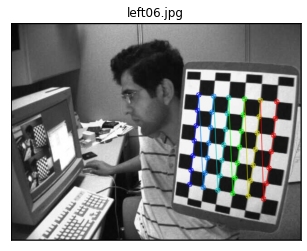

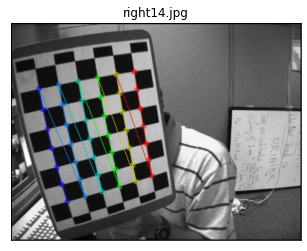

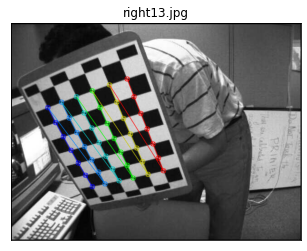

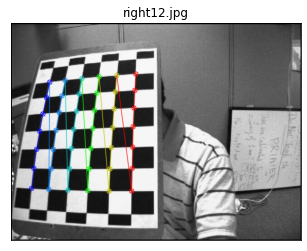

...

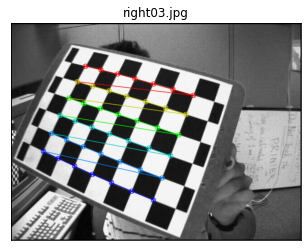

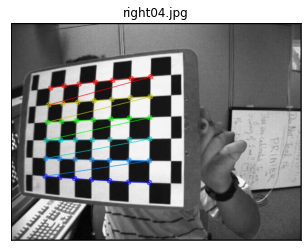

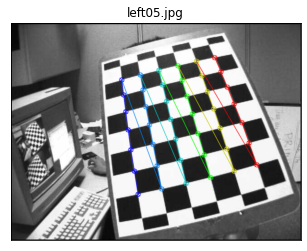

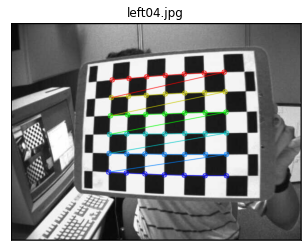

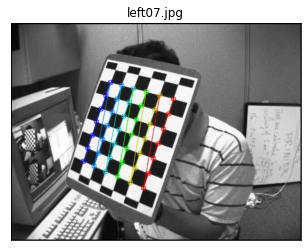

In [2]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
import glob #usada para manipular os arquivos

print(cv.__version__)

# critério de parada para obtenção dos contornos em nível de subpixel
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# define os pontos no objeto como (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*7,3), np.float32)
objp[:,:2] = np.mgrid[0:7,0:6].T.reshape(-1,2)

# Vetores para estabelecer as correspondências em cada imagem.
objpoints = [] # Pontos 3D do objeto
imgpoints = [] # Pontos 2D no plano da imagem

# Obtém o nome de todas as imagens na pasta
images = glob.glob('/content/drive/MyDrive/ColabFiles/Calibration/*.jpg')

for fname in images:
  img = cv.imread(fname)
  image_name = fname.split('Calibration/')[1]
  gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

  # Encontra os cantos do tabuleiro
  ret, corners = cv.findChessboardCorners(gray, (7,6), None)
  # If found, add object points, image points (after refining them)
  if ret == True:
    #adiciona os pontos do objeto
    objpoints.append(objp)
    #refina os corners
    corners2 = cv.cornerSubPix(gray,corners, (11,11), (-1,-1), criteria)
    #adiciona os pontos da imagem
    imgpoints.append(corners)
    # Desenha e mostra os corners
    cv.drawChessboardCorners(img, (7,6), corners2, ret)

    plt.imshow(img)
    plt.title(image_name)
    plt.xticks([]), plt.yticks([])
    plt.show()

## 2 - Calibração

O método `calibrateCamera` realiza a calibração propriamente dita. Esse método necessita dos seguintes parâmetros:
* Vetor de vetores contendo os pontos do objeto
* Vetor de vetores contendo os pontos da imagem
* Tamanho da imagem, usado somente para inicializações no algoritmo
* Matriz de parâmetros intrínsecos inicial, caso deseje refinar parâmetros existentes. Caso contrário, pode ser passado `None`
* Coeficientes de distorção iniciais, caso deseje refinar esses coeficientes. Caso contrário, pode ser passado `None`
* Parâmetros opcionais. Veja mais detalhes [aqui](https://https://docs.opencv.org/4.5.3/d9/d0c/group__calib3d.html#ga3207604e4b1a1758aa66acb6ed5aa65d)

O método retorna:
* O erro quadrático médio das reprojeções
* A matriz de parâmetros intrínsecos na forma:
$$A=\begin{bmatrix}
f_x&0&c_x\\
0&f_y&c_y\\
0&0&1
\end{bmatrix}$$
* Os coeficientes de distorção radial $k_1,k_2$ e tangencial $p_1,p_2$ (a qual pode ser definida como 0 por uma flag)
* Os vetores de rotação e translação para cada imagem

In [3]:
ret, mtx, dist, rvecs, tvecs = cv.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
rvecs

[array([[-0.4516796 ],
        [ 0.26969047],
        [-3.08347904]]), array([[-0.29764648],
        [ 0.40887432],
        [-1.43298373]]), array([[ 0.49511976],
        [-0.18984091],
        [-1.73441646]]), array([[ 0.3145325 ],
        [ 0.48824218],
        [-1.83214007]]), array([[-0.35333782],
        [-0.25949193],
        [-1.57624581]]), array([[-0.30235831],
        [ 0.37695057],
        [-1.44038112]]), array([[-0.15515246],
        [-0.4649618 ],
        [ 1.34521835]]), array([[-0.32022368],
        [ 0.14594012],
        [-1.24961655]]), array([[-0.35608188],
        [-0.2253832 ],
        [-1.56624524]]), array([[-0.45894685],
        [-0.07051965],
        [-1.33149296]]), array([[-0.28005395],
        [-0.37808252],
        [-2.74580019]]), array([[ 0.41637857],
        [ 0.67597869],
        [-1.33809548]]), array([[ 0.64257131],
        [ 0.28860912],
        [-2.92831719]]), array([[ 0.52029814],
        [-0.45341169],
        [-1.70122628]]), array([[-0.41208083

## 3 - Remoção da distorção

Uma vez obtida a matriz dos parâmetros intrínsecos, podemos obter os pontos da câmera sem distorção. O método `undistort` pode ser utilizado para obter a imagem sem distorção. Esse método recebe os seguintes parâmetros:
* A imagem de origem
* A matriz de câmera
* Os coeficientes de distorção
* A matriz de destino (opcional, ela será retornada)
* Uma matriz de câmera refinada (veja o exercício 1 a seguir)

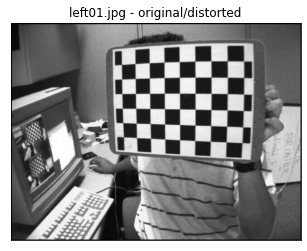

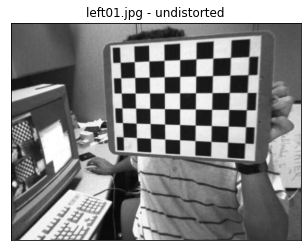

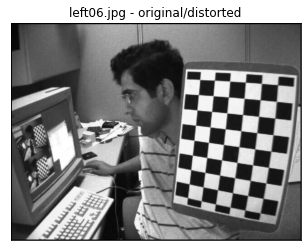

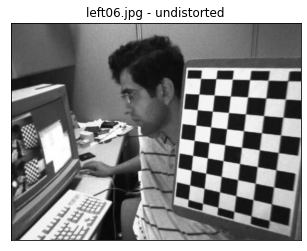

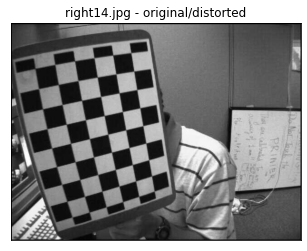

...

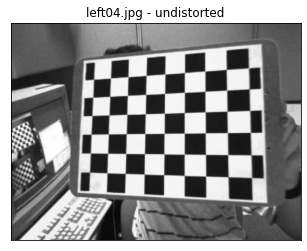

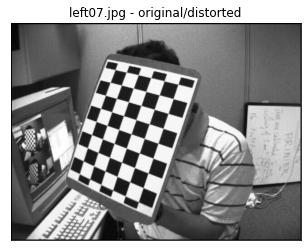

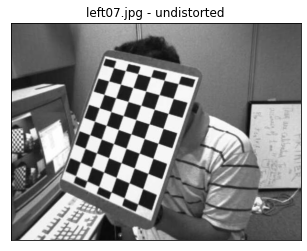

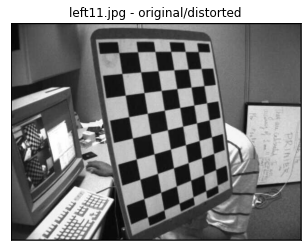

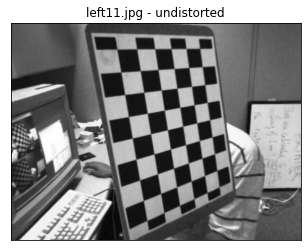

In [4]:
for fname in images:
  img = cv.imread(fname)
  dst = cv.undistort(img, mtx, dist)
  plt.imshow(img)
  image_name = fname.split('Calibration/')[1]

  plt.title(image_name + " - original/distorted")
  plt.xticks([]), plt.yticks([])
  plt.show()
  plt.imshow(dst)
  plt.title(image_name + " - undistorted")
  plt.xticks([]), plt.yticks([])
  plt.show()

## 4 - Exercícios

1. OpenCV possui ainda um método chamado [`getOptimalNewCameraMatrix`](https://docs.opencv.org/3.4/d9/d0c/group__calib3d.html#:~:text=getOptimalNewCameraMatrix())para refinar os parâmetros da câmera. Pesquise sobre como esse método funciona e veja o efeito dele na geração de imagens sem distorção.



2. Pesquise tutoriais para realização de calibração através de vídeos gravados ou em tempo real (Webcam).

1 - getOptimalNewCameraMatrix	(	InputArray 	cameraMatrix, <br>
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp; InputArray 	distCoeffs, <br>
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp; Size 	imageSize, <br>
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp; double 	alpha, <br>
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp; Size 	newImgSize = Size(), <br>
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp; Rect * 	validPixROI = 0, <br>
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp; bool 	centerPrincipalPoint = false)	

*  cameraMatrix	 - Input camera intrinsic matrix. <br>
*  distCoeffs -	Input vector of distortion coefficients (k1,k2,p1,p2[,k3[,k4,k5,k6[,s1,s2,s3,s4[,τx,τy]]]]) of 4, 5, 8, 12 or 14 elements. If the vector is NULL/empty, the zero distortion coefficients are assumed. <br>
*  imageSize	Original image size.
*  alpha -	Free scaling parameter between 0 (when all the pixels in the undistorted image are valid) and 1 (when all the source image pixels are retained in the undistorted image). See stereoRectify for details.
*  newImgSize -	Image size after rectification. By default, it is set to imageSize .
*  validPixROI -	Optional output rectangle that outlines all-good-pixels region in the undistorted image. See roi1, roi2 description in stereoRectify .
*  centerPrincipalPoint	- Optional flag that indicates whether in the new camera intrinsic matrix the principal point should be at the image center or not. By default, the principal point is chosen to best fit a subset of the source image (determined by alpha) to the corrected image.

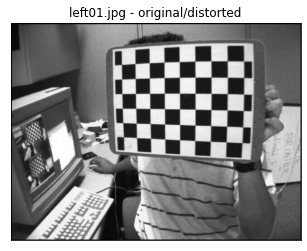

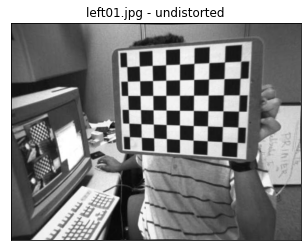

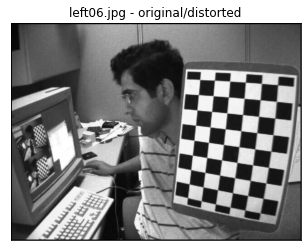

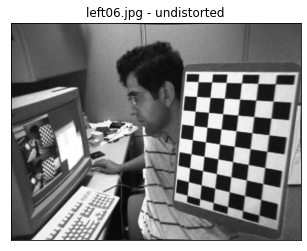

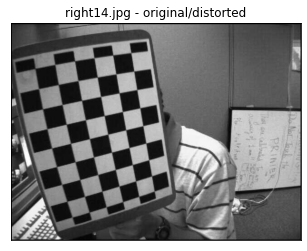

...

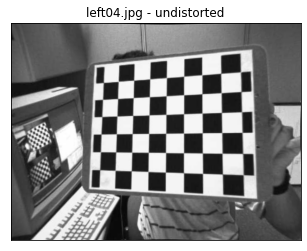

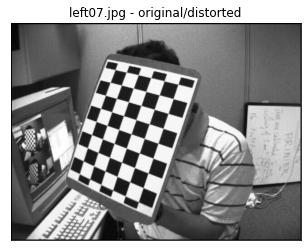

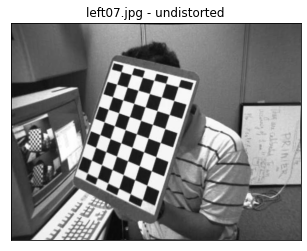

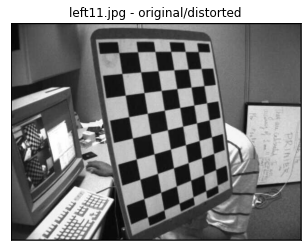

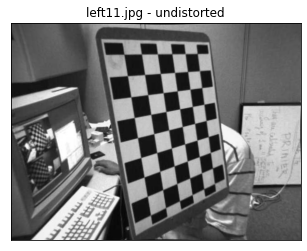

In [5]:
for fname in images:
  img = cv.imread(fname)
  dst, roi = cv.getOptimalNewCameraMatrix(cameraMatrix = mtx, distCoeffs = dist, imageSize = gray.shape[::-1], alpha = 0)
  mapx, mapy = cv.initUndistortRectifyMap(mtx, dist, None, dst, gray.shape[::-1], 5)
  dst = cv.remap(img, mapx, mapy, cv.INTER_LINEAR)

  plt.imshow(img)
  image_name = fname.split('Calibration/')[1]

  plt.title(image_name + " - original/distorted")
  plt.xticks([]), plt.yticks([])
  plt.show()
  plt.imshow(dst)
  plt.title(image_name + " - undistorted")
  plt.xticks([]), plt.yticks([])
  plt.show()

2 - [OpenCV Basics - 16 - Camera Calibration Part 2](https://www.youtube.com/watch?v=v7jutAmWJVQ&ab_channel=GeorgeLecakes) <br>

[Camera Calibration in Python with OpenCV - Python Script with Images](https://www.youtube.com/watch?v=3h7wgR5fYik&ab_channel=TheCodingLib) <br>

[calib 3D: OpenCV Camera Calibration](https://www.youtube.com/watch?v=DrXIQfQHFv0&ab_channel=GaryBradski)
